In [27]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from ydata_profiling import ProfileReport
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import tree

In [7]:
Data_set = pd.read_csv("winequality-red.csv")

In [8]:
ProfileReport(Data_set)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
Data = Data_set.copy()

In [40]:
Data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [12]:
x =Data.iloc[:, :-1]
y = Data.iloc[:,-1]

In [13]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [14]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [15]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=300)

In [19]:
data_model = DecisionTreeClassifier()

In [20]:
data_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [22]:
data_model.predict(x_test)

array([6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 7, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 6, 7, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 6, 8, 5, 6, 5, 5, 4, 6, 6, 7, 7, 5, 5,
       6, 4, 6, 5, 5, 7, 5, 5, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       4, 6, 7, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 7,
       5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 5, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 5, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 7, 5, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 5, 5, 6, 4, 5, 6, 5, 6, 7, 5, 5, 6, 5, 7, 7, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 7, 6, 6, 7, 5, 6, 5,

In [23]:
data_model.score(x_test,y_test)

0.6

In [44]:
data_model.score(x_train,y_train)

1.0

In [30]:
outfile = open('data_gini_meta.dot','w')
tree.export_graphviz(data_model, out_file= outfile, feature_names=x.columns)

In [33]:
set(y)

{3, 4, 5, 6, 7, 8}

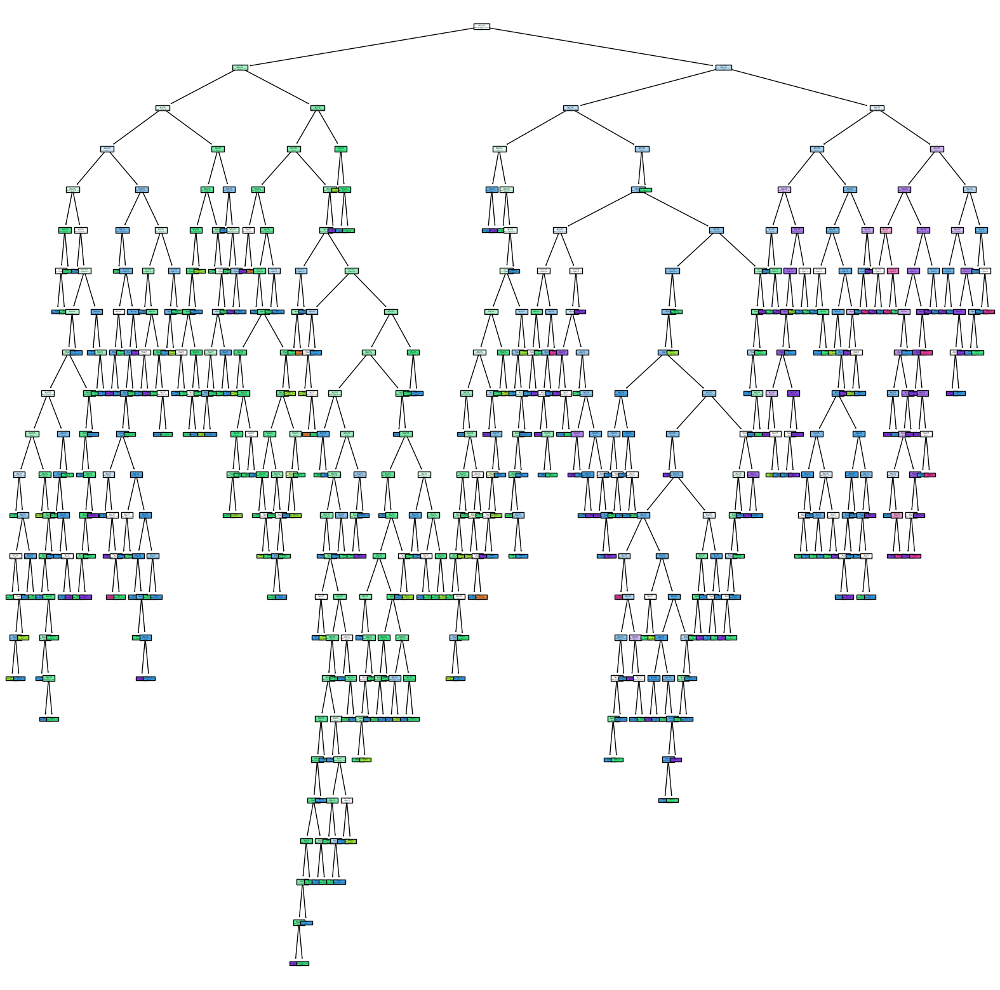

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(data_model,filled=True, class_names=[str(i) for i in set(y)])
plt.savefig('data_model_fig')

#Since above data considered is complicated hence considering the part of data for analysis. 

In [36]:
Data1 = Data_set.copy()

In [101]:
data1 = Data1.head(500)

In [102]:
data1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [103]:
x1 = data1.iloc[ : ,:-1]
y1 = data1.iloc[:,-1]

In [104]:
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0


In [105]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [183]:
x1_train, x1_test,y1_train, y1_test= train_test_split(x1,y1, test_size=0.2, random_state=300)

In [184]:
data_model1 = DecisionTreeClassifier()

In [185]:
data_model1.fit(x1_train, y1_train)

DecisionTreeClassifier()

In [186]:
data_model1.score(x1_train,y1_train)

1.0

In [187]:
data_model1.score(x1_test,y1_test)

0.64

#Post Pruning Operation

In [199]:
path = data_model1.cost_complexity_pruning_path(x1_train,y1_train)

In [200]:
path

{'ccp_alphas': array([0.        , 0.00208333, 0.0021875 , 0.00227273, 0.00230769,
        0.00232143, 0.00238095, 0.0024    , 0.00242063, 0.0025    ,
        0.0025    , 0.0025    , 0.0025    , 0.0025    , 0.0025    ,
        0.00297619, 0.00325   , 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00375   , 0.00375   , 0.00375   , 0.00378788,
        0.00392857, 0.00395604, 0.004     , 0.00404062, 0.00416667,
        0.00416667, 0.00444444, 0.00445232, 0.0045    , 0.0045    ,
        0.00455882, 0.00462308, 0.004625  , 0.0048    , 0.00486111,
        0.005     , 0.005     , 0.00500221, 0.00508333, 0.00547078,
        0.00549717, 0.00595238, 0.006     , 0.00642857, 0.00658437,
        0.00663004, 0.00666667, 0.00666667, 0.00680556, 0.00684921,
        0.00696429, 0.00743295, 0.00747243, 0.00763804, 0.00769231,
        0.00782143, 0.00801842, 0.00823039, 0.00834612, 0.00984431,
        0.01050187, 0.01062166, 0.010822  , 0.0126596 , 0.0134276 ,
        0.01420394, 0.01892043, 0.

In [201]:
ccp_alpha = path.ccp_alphas

In [202]:
dt_model = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model.append(dt_m)

In [203]:
train_score = [i.score(x1_train,y1_train) for i in dt_model]

In [204]:
test_score = [i.score(x1_test,y1_test) for i in dt_model]

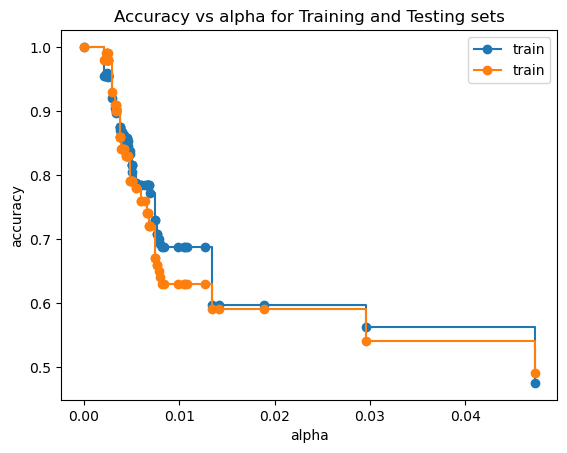

In [205]:
fig , ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for Training and Testing sets')
ax.plot(ccp_alpha,train_score, marker = 'o', label = "train", drawstyle = "steps-post")
ax.plot(ccp_alpha,test_score, marker = 'o', label = "train", drawstyle = "steps-post")
ax.legend()
plt.show()

#Final Model

In [210]:
Data_Model_ccp = DecisionTreeClassifier(random_state=100, ccp_alpha=0.018)

In [211]:
Data_Model_ccp.fit(x1_train,y1_train)

DecisionTreeClassifier(ccp_alpha=0.018, random_state=100)

In [212]:
Data_Model_ccp.score(x1_train,y1_train)

0.62

In [214]:
Data_Model_ccp.score(x1_test,y1_test)

0.55

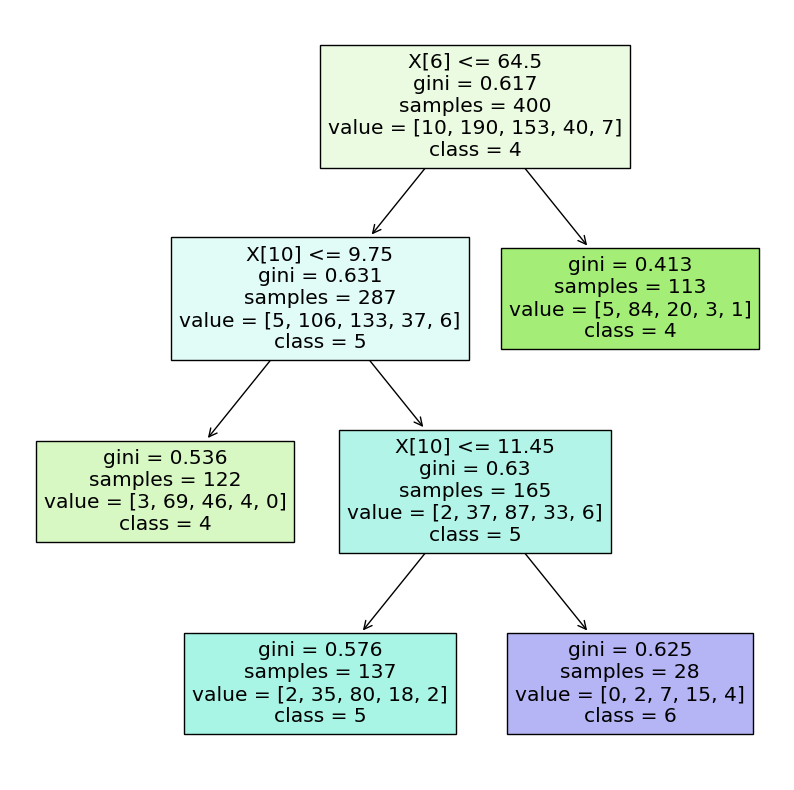

In [217]:
plt.figure(figsize=(10,10))
tree.plot_tree(Data_Model_ccp,filled=True, class_names=[str(i) for i in set(y1)])
plt.savefig('Data_Model_DT_fig')